## 멀티모달 데이터로 학습

In [1]:
import os
os.environ['CUDA_VISIBLE_DEVICES']='3'

In [2]:
import tensorflow as tf
from tensorflow.keras.callbacks import CSVLogger, ModelCheckpoint, EarlyStopping
from tensorflow.keras.callbacks import ReduceLROnPlateau
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import tensorflow.keras as keras

from models.cnn import mini_XCEPTION
from utils.datasets import DataManager
from utils.datasets import split_data
from utils.preprocessor import preprocess_input

tf.__version__

'2.0.0-beta1'

In [3]:
!mkdir -p ../trained_models/kor_multi_modal_emotion_model_frontal_face/

In [5]:
%install_ext https://raw.github.com/cpcloud/ipython-autotime/master/autotime.py

UsageError: Line magic function `%install_ext` not found.


### Single model w/ multiprocessing

In [4]:
%%time

# parameters
NUM_GPU = 6
batch_size = 32 * NUM_GPU
batch_size = 32
num_epochs = 3
input_shape = (64, 64, 1)
validation_split = .2
verbose = 1
num_classes = 7
patience = 50
base_path = '../trained_models/kor_multi_modal_emotion_model_frontal_face/'

# mirrored_strategy = tf.distribute.MirroredStrategy()
# with mirrored_strategy.scope():
# data generator
data_generator = ImageDataGenerator(
                        featurewise_center=False,
                        featurewise_std_normalization=False,
                        rotation_range=10,
                        width_shift_range=0.1,
                        height_shift_range=0.1,
                        zoom_range=.1,
                        horizontal_flip=True)

# model parameters/compilation
model = mini_XCEPTION(input_shape, num_classes)
# model = tf.keras.utils.multi_gpu_model(model, gpus=NUM_GPU)
model.compile(optimizer='adam', loss='categorical_crossentropy',
              metrics=['accuracy'])
model.summary()

datasets = ['kor_multi_modal']
for dataset_name in datasets:
    print('Training dataset:', dataset_name)

    # callbacks
    log_file_path = base_path + dataset_name + '_emotion_training.log'
    csv_logger = CSVLogger(log_file_path, append=False)
    early_stop = EarlyStopping('val_loss', patience=patience)
    reduce_lr = ReduceLROnPlateau('val_loss', factor=0.1,
                                  patience=int(patience/4), verbose=1)
    trained_models_path = base_path + dataset_name + '_mini_XCEPTION'
    model_names = trained_models_path + '.{epoch:02d}-{val_accuracy:.2f}.hdf5'
    model_checkpoint = ModelCheckpoint(model_names, 'val_loss', verbose=1,
                                                    save_best_only=False)
    callbacks = [model_checkpoint, csv_logger, early_stop, reduce_lr]

    # loading dataset
    data_loader = DataManager(dataset_name, image_size=input_shape[:2])
    faces, emotions = data_loader.get_data()
    faces = preprocess_input(faces)
    num_samples, num_classes = emotions.shape
    train_data, val_data = split_data(faces, emotions, validation_split)
    train_faces, train_emotions = train_data
    model.fit_generator(data_generator.flow(train_faces, train_emotions,
                                            batch_size),
                        steps_per_epoch=len(train_faces) / batch_size,
                        epochs=num_epochs, verbose=1, callbacks=callbacks,
                        validation_data=val_data,
                       use_multiprocessing=True)
    
print("")

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 64, 64, 1)]  0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 62, 62, 8)    72          input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 62, 62, 8)    32          conv2d[0][0]                     
__________________________________________________________________________________________________
activation (Activation)         (None, 62, 62, 8)    0           batch_normalization[0][0]        
______________________________________________________________________________________________

/tf/notebooks/face_emotion/face_classification_modi/src/utils/datasets.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  emotions = pd.get_dummies(data['emotion']).as_matrix()


Epoch 1/3


W0721 00:51:00.634879 139942739580672 deprecation.py:323] From /root/.local/share/jupyter/kernels/rt-face-detect/lib/python3.5/site-packages/tensorflow/python/ops/math_grad.py:1250: add_dispatch_support.<locals>.wrapper (from tensorflow.python.ops.array_ops) is deprecated and will be removed in a future version.
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


3212/3212 [============================>.] - ETA: 0s - loss: 1.8064 - accuracy: 0.2994
Epoch 00001: saving model to ../trained_models/kor_multi_modal_emotion_model_frontal_face/kor_multi_modal_mini_XCEPTION.01-0.24.hdf5
3213/3212 [==============================] - 208s 65ms/step - loss: 1.8063 - accuracy: 0.2994 - val_loss: 1.9800 - val_accuracy: 0.2365
Epoch 2/3
2933/3212 [==========================>...] - ETA: 16s - loss: 1.5943 - accuracy: 0.3939

Process Keras_worker_ForkPoolWorker-3:
Traceback (most recent call last):
  File "/usr/lib/python3.5/multiprocessing/process.py", line 249, in _bootstrap
    self.run()
  File "/usr/lib/python3.5/multiprocessing/process.py", line 93, in run
    self._target(*self._args, **self._kwargs)
  File "/usr/lib/python3.5/multiprocessing/pool.py", line 108, in worker
    task = get()
  File "/usr/lib/python3.5/multiprocessing/queues.py", line 345, in get
    return ForkingPickler.loads(res)
KeyboardInterrupt


KeyboardInterrupt: 

### multi GPU w/ multiprocessing

In [ ]:
%%time

# parameters
NUM_GPU = 6
batch_size = 32 * NUM_GPU
num_epochs = 3
input_shape = (64, 64, 1)
validation_split = .2
verbose = 1
num_classes = 7
patience = 50
base_path = '../trained_models/kor_multi_modal_emotion_model/'

# mirrored_strategy = tf.distribute.MirroredStrategy()
# with mirrored_strategy.scope():
# data generator
data_generator = ImageDataGenerator(
                        featurewise_center=False,
                        featurewise_std_normalization=False,
                        rotation_range=10,
                        width_shift_range=0.1,
                        height_shift_range=0.1,
                        zoom_range=.1,
                        horizontal_flip=True)

# model parameters/compilation

# mirrored_strategy = tf.distribute.MirroredStrategy()
# with mirrored_strategy.scope():
# error with fit_generator()

with tf.device('/cpu:0'):
    model = mini_XCEPTION(input_shape, num_classes)
    
parallel_model = tf.keras.utils.multi_gpu_model(model, gpus=NUM_GPU)
    
parallel_model.compile(optimizer='adam', loss='categorical_crossentropy',
              metrics=['accuracy'])


datasets = ['kor_multi_modal']
for dataset_name in datasets:
    print('Training dataset:', dataset_name)

    # callbacks
    log_file_path = base_path + dataset_name + '_emotion_training.log'
    csv_logger = CSVLogger(log_file_path, append=False)
    early_stop = EarlyStopping('val_loss', patience=patience)
    reduce_lr = ReduceLROnPlateau('val_loss', factor=0.1,
                                  patience=int(patience/4), verbose=1)
    trained_models_path = base_path + dataset_name + '_mini_XCEPTION'
    model_names = trained_models_path + '.{epoch:02d}-{val_accuracy:.2f}.hdf5'
    model_checkpoint = ModelCheckpoint(model_names, 'val_loss', verbose=1,
                                                    save_best_only=False)
    callbacks = [model_checkpoint, csv_logger, early_stop, reduce_lr]

    # loading dataset
    data_loader = DataManager(dataset_name, image_size=input_shape[:2])
    faces, emotions = data_loader.get_data()
    faces = preprocess_input(faces)
    num_samples, num_classes = emotions.shape
    train_data, val_data = split_data(faces, emotions, validation_split)
    train_faces, train_emotions = train_data
    parallel_model.fit_generator(data_generator.flow(train_faces, train_emotions,
                                            batch_size),
                        steps_per_epoch=int(len(train_faces) / batch_size * NUM_GPU),
                        epochs=num_epochs, verbose=1, callbacks=callbacks,
                        validation_data=val_data,
                       use_multiprocessing=True,
                       workers=6)
    
print("")

### multi GPU

In [3]:
%%time

# parameters
NUM_GPU = 6
batch_size = 32 * NUM_GPU
num_epochs = 3
input_shape = (64, 64, 1)
validation_split = .2
verbose = 1
num_classes = 7
patience = 50
base_path = '../trained_models/kor_multi_modal_emotion_model/'

# mirrored_strategy = tf.distribute.MirroredStrategy()
# with mirrored_strategy.scope():
# data generator
data_generator = ImageDataGenerator(
                        featurewise_center=False,
                        featurewise_std_normalization=False,
                        rotation_range=10,
                        width_shift_range=0.1,
                        height_shift_range=0.1,
                        zoom_range=.1,
                        horizontal_flip=True)

# model parameters/compilation

model = mini_XCEPTION(input_shape, num_classes)
# model.summary()

model = tf.keras.utils.multi_gpu_model(model, gpus=NUM_GPU)
model.compile(optimizer='adam', loss='categorical_crossentropy',
              metrics=['accuracy'])


datasets = ['kor_multi_modal']
for dataset_name in datasets:
    print('Training dataset:', dataset_name)

    # callbacks
    log_file_path = base_path + dataset_name + '_emotion_training.log'
    csv_logger = CSVLogger(log_file_path, append=False)
    early_stop = EarlyStopping('val_loss', patience=patience)
    reduce_lr = ReduceLROnPlateau('val_loss', factor=0.1,
                                  patience=int(patience/4), verbose=1)
    trained_models_path = base_path + dataset_name + '_mini_XCEPTION'
    model_names = trained_models_path + '.{epoch:02d}-{val_accuracy:.2f}.hdf5'
    model_checkpoint = ModelCheckpoint(model_names, 'val_loss', verbose=1,
                                                    save_best_only=False)
    callbacks = [model_checkpoint, csv_logger, early_stop, reduce_lr]

    # loading dataset
    data_loader = DataManager(dataset_name, image_size=input_shape[:2])
    faces, emotions = data_loader.get_data()
    faces = preprocess_input(faces)
    num_samples, num_classes = emotions.shape
    train_data, val_data = split_data(faces, emotions, validation_split)
    train_faces, train_emotions = train_data
    model.fit_generator(data_generator.flow(train_faces, train_emotions,
                                            batch_size),
                        steps_per_epoch=int(len(train_faces) / batch_size * NUM_GPU),
                        epochs=num_epochs, verbose=1, callbacks=callbacks,
                        validation_data=val_data)
    
print("")

Training dataset: kor_multi_modal


/tf/notebooks/face_emotion/face_classification_modi/src/utils/datasets.py:90: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  emotions = pd.get_dummies(data['emotion']).as_matrix()


Epoch 1/3


W0713 16:03:20.882381 140583017686784 deprecation.py:323] From /root/.local/share/jupyter/kernels/rt-face-detect/lib/python3.5/site-packages/tensorflow/python/ops/math_grad.py:1250: add_dispatch_support.<locals>.wrapper (from tensorflow.python.ops.array_ops) is deprecated and will be removed in a future version.
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


248/249 [============================>.] - ETA: 0s - loss: 0.5938 - accuracy: 0.7568
Epoch 00001: saving model to ../trained_models/kor_multi_modal_emotion_model/kor_multi_modal_mini_XCEPTION.01-0.44.hdf5
249/249 [==============================] - 142s 571ms/step - loss: 0.5929 - accuracy: 0.7573 - val_loss: 6.2647 - val_accuracy: 0.4395
Epoch 2/3
248/249 [============================>.] - ETA: 0s - loss: 0.3823 - accuracy: 0.8588
Epoch 00002: saving model to ../trained_models/kor_multi_modal_emotion_model/kor_multi_modal_mini_XCEPTION.02-0.26.hdf5
249/249 [==============================] - 66s 266ms/step - loss: 0.3819 - accuracy: 0.8590 - val_loss: 5.8697 - val_accuracy: 0.2580
Epoch 3/3
248/249 [============================>.] - ETA: 0s - loss: 0.2762 - accuracy: 0.9045
Epoch 00003: saving model to ../trained_models/kor_multi_modal_emotion_model/kor_multi_modal_mini_XCEPTION.03-0.46.hdf5
249/249 [==============================] - 67s 270ms/step - loss: 0.2761 - accuracy: 0.9046 - va

![kor_multi_modal_total_train_result.png](../images/kor_multi_modal_total_train_result.png)

In [6]:
%%bash

source /root/.local/share/jupyter/kernels/rt-face-detect/bin/activate

# demo 이미지 데이터 테스팅
mkdir -p ../images/kor_multi_modal_results
TEST_IMG=../images/test_image.jpg
OUTPUT_IMG=../images/kor_multi_modal_results/kor_multi_modal_mini_XCEPTION.60-0.57.hdf5.jpg

python image_emotion_gender_kor_multi_modal_demo.py $TEST_IMG $OUTPUT_IMG

<CascadeClassifier 0x7fd5605e2fb0>


2019-07-14 08:41:50.786176: I tensorflow/stream_executor/platform/default/dso_loader.cc:42] Successfully opened dynamic library libcuda.so.1
2019-07-14 08:41:51.467864: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1640] Found device 0 with properties: 
name: TITAN V major: 7 minor: 0 memoryClockRate(GHz): 1.455
pciBusID: 0000:b2:00.0
2019-07-14 08:41:51.468418: I tensorflow/stream_executor/platform/default/dso_loader.cc:42] Successfully opened dynamic library libcudart.so.10.0
2019-07-14 08:41:51.471033: I tensorflow/stream_executor/platform/default/dso_loader.cc:42] Successfully opened dynamic library libcublas.so.10.0
2019-07-14 08:41:51.473274: I tensorflow/stream_executor/platform/default/dso_loader.cc:42] Successfully opened dynamic library libcufft.so.10.0
2019-07-14 08:41:51.473855: I tensorflow/stream_executor/platform/default/dso_loader.cc:42] Successfully opened dynamic library libcurand.so.10.0
2019-07-14 08:41:51.476749: I tensorflow/stream_executor/platform/default/d

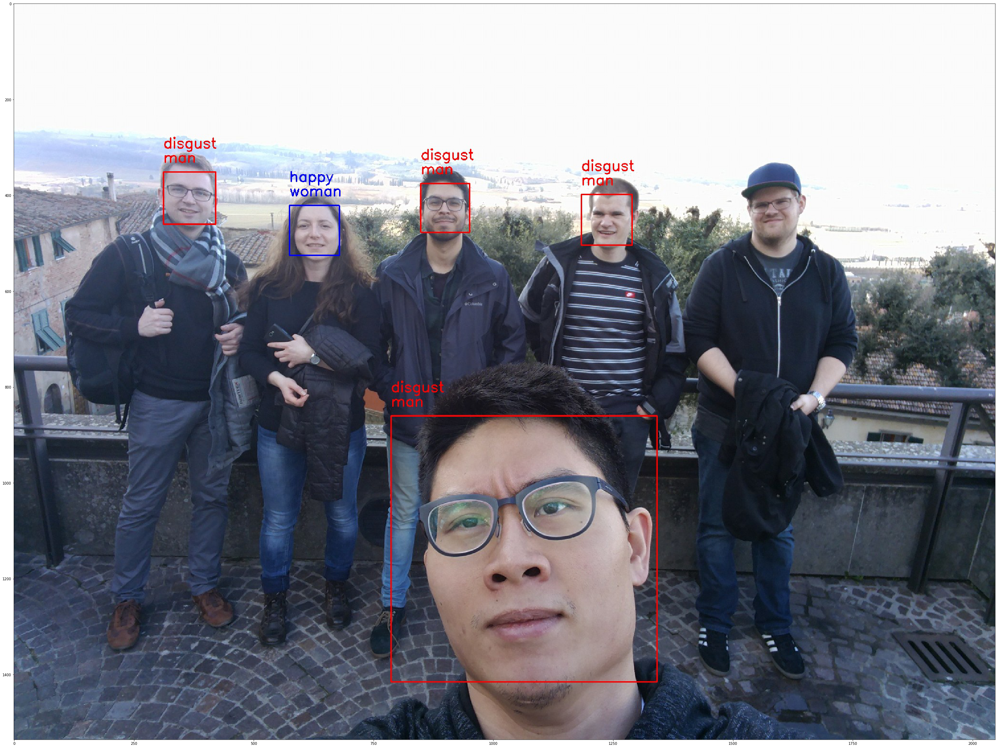

In [7]:
# 전체 멀티모달 데이터로 학습한 결과
import matplotlib.pyplot as plt
%matplotlib inline

img = plt.imread('../images/kor_multi_modal_results/kor_multi_modal_mini_XCEPTION.60-0.57.hdf5.jpg')
fig = plt.figure(figsize=(50, 50))
plt.imshow(img)

In [3]:
!ls ../trained_models/

detection_models		     gender_models
emotion_models			     kor_multi_modal_emotion_model
fer2013_big_XCEPTION.54-0.66.hdf5    kor_multi_modal_emotion_model2
fer2013_mini_XCEPTION.119-0.65.hdf5  kor_multi_modal_emotion_model_frontal_face


In [4]:
%%bash

source /root/.local/share/jupyter/kernels/rt-face-detect/bin/activate

# demo 이미지 데이터 테스팅
mkdir -p ../images/kor_multi_modal_results
TEST_IMG=../images/test_image.jpg
MODEL_PATH=../trained_models/kor_multi_modal_emotion_model_frontal_face/kor_multi_modal_mini_XCEPTION.127-0.29.hdf5
OUTPUT_IMG=../images/kor_multi_modal_results/kor_multi_modal_mini_XCEPTION.127-0.29.hdf5.jpg

python image_emotion_gender_kor_multi_modal_demo.py $TEST_IMG $MODEL_PATH $OUTPUT_IMG

2019-07-21 07:55:46.363716: I tensorflow/stream_executor/platform/default/dso_loader.cc:42] Successfully opened dynamic library libcuda.so.1
2019-07-21 07:55:46.482961: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1640] Found device 0 with properties: 
name: TITAN V major: 7 minor: 0 memoryClockRate(GHz): 1.455
pciBusID: 0000:3e:00.0
2019-07-21 07:55:46.483282: I tensorflow/stream_executor/platform/default/dso_loader.cc:42] Successfully opened dynamic library libcudart.so.10.0
2019-07-21 07:55:46.484874: I tensorflow/stream_executor/platform/default/dso_loader.cc:42] Successfully opened dynamic library libcublas.so.10.0
2019-07-21 07:55:46.486345: I tensorflow/stream_executor/platform/default/dso_loader.cc:42] Successfully opened dynamic library libcufft.so.10.0
2019-07-21 07:55:46.486708: I tensorflow/stream_executor/platform/default/dso_loader.cc:42] Successfully opened dynamic library libcurand.so.10.0
2019-07-21 07:55:46.488594: I tensorflow/stream_executor/platform/default/d

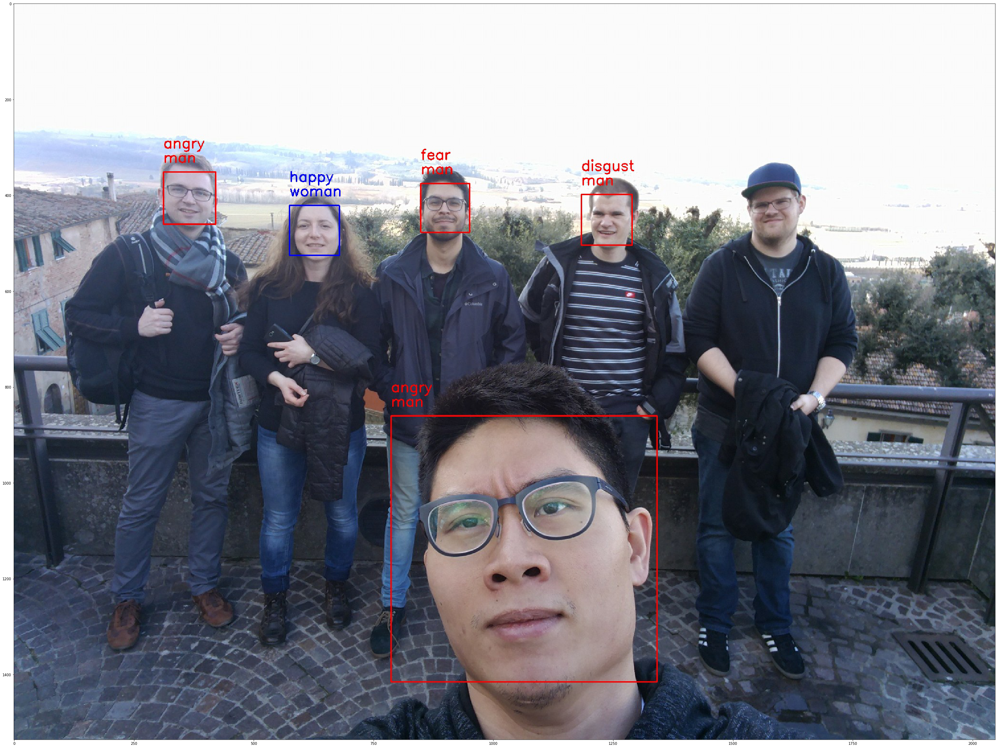

In [6]:
# 얼굴 디텍팅되는 데이터로만 학습한 정성적 결과
import matplotlib.pyplot as plt
%matplotlib inline

img = plt.imread('../images/kor_multi_modal_results/kor_multi_modal_mini_XCEPTION.127-0.29.hdf5.jpg')
fig = plt.figure(figsize=(50, 50))
plt.imshow(img)

In [9]:
!ls -alh ../datasets/kor_multi_modal

total 5.9G
drwxr-xr-x 3 root root 4.0K Jul 21 00:44 .
drwxr-xr-x 4 root root  104 Jun 30 09:50 ..
drwxr-xr-x 2 root root  12K Jun 30 09:50 part1
-rw-r--r-- 1 root root 1.9G Jul 13 13:54 prep_col_all_mdf.csv
-rw-r--r-- 1 root root 990M Jul 21 00:44 prep_col_all_mdf_frontal_face.csv
-rw-r--r-- 1 root root  76M Jul 13 15:29 prep_col_all_mdf_sample.csv
-rw-r--r-- 1 root root 240M Jul  6 18:18 prep_part1.csv
-rw-r--r-- 1 root root  39M Jul 20 20:13 prep_part1_frontal_face.csv
-rw-r--r-- 1 root root 111M Jul 21 00:34 prep_part1_mid.csv
-rw-r--r-- 1 root root 415M Jul  6 18:31 prep_part2.csv
-rw-r--r-- 1 root root  48M Jul 20 19:59 prep_part2_frontal_face.csv
-rw-r--r-- 1 root root 222M Jul 21 00:33 prep_part2_mid.csv
-rw-r--r-- 1 root root 464M Jul  6 18:38 prep_part3.csv
-rw-r--r-- 1 root root  59M Jul 20 19:43 prep_part3_frontal_face.csv
-rw-r--r-- 1 root root 273M Jul 21 00:32 prep_part3_mid.csv
-rw-r--r-- 1 root root 476M Jul  6 18:42 prep_part4.csv
-rw-r--r-- 1 root root  55M Jul 20 19:

In [24]:
import numpy as np
import modin.pandas as pd
import ipywidgets

In [11]:
train_df = pd.read_csv('../datasets/kor_multi_modal/prep_col_all_mdf_frontal_face.csv')

In [42]:
def view(idx):
    arr = np.asarray(train_df.iloc[idx]['pixels'].split(" "), dtype=np.int8)
    img = arr.reshape((48,48))
    plt.imshow(img, 'gray')
    
ipywidgets.interact(view, idx=ipywidgets.IntSlider(min=0, max=train_df.shape[0]-1))

interactive(children=(IntSlider(value=0, description='idx', max=128498), Output()), _dom_classes=('widget-inte…

<function __main__.view(idx)>

## TODO: val 정확도 향상, Train 속도 향상
    * hog로 얼굴이 디텍팅되는 것만 트레이닝 (완료)
    * 데이터 정제 후 재 학습
    * 다른 모델 사용
    * TFRecord with tf.data
    * multi GPU